# HUAWEI Social Network Analysis

## Import DATA

In [1]:
import pandas as pd
import matplotlib.pyplot as plt
import networkx as nx
import numpy as np
import seaborn as sns
from sklearn.decomposition import TruncatedSVD
import random
import community as community_louvain
import matplotlib.cm as cm

In [2]:
facebook_file_path = 'data/Facebook_Data.xlsx'
twitter_file_path = 'data/Twitter_Data.xlsx'
instagram_file_path = 'data/Instagram_Data.xlsx'

In [3]:
facebook_df = pd.read_excel(facebook_file_path, index_col=0)
twitter_df = pd.read_excel(twitter_file_path, index_col=0)
instagram_df = pd.read_excel(instagram_file_path, index_col=0)

In [4]:
print("Facebook DataFrame:")
print(facebook_df.head())

print("\nTwitter DataFrame:")
print(twitter_df.head())

print("\nInstagram DataFrame:")
print(instagram_df.head())

Facebook DataFrame:
                     Meredith Stransky    Brittney Mazzella    Yi Cook    \
Meredith Stransky                      0                    0          0   
Brittney Mazzella                      0                    0          0   
Yi Cook                                0                    0          0   
Porter Devries                         0                    0          0   
Suzanne Syverson                       0                    0          0   

                     Porter Devries    Suzanne Syverson    Ladawn Creason    \
Meredith Stransky                   0                   0                 0   
Brittney Mazzella                   0                   0                 0   
Yi Cook                             0                   0                 0   
Porter Devries                      0                   0                 0   
Suzanne Syverson                    0                   0                 0   

                     Mikel Lamberson    Lakendra

## Data Preprocessing

In [5]:
facebook_null_values = facebook_df.isnull().sum()
twitter_null_values = twitter_df.isnull().sum()
instagram_null_values = instagram_df.isnull().sum()

print("Null values in Facebook DataFrame:")
print(facebook_null_values[facebook_null_values > 0])
print("\nNull values in Twitter DataFrame:")
print(twitter_null_values[twitter_null_values > 0])
print("\nNull values in Instagram DataFrame:")
print(instagram_null_values[instagram_null_values > 0])

Null values in Facebook DataFrame:
Series([], dtype: int64)

Null values in Twitter DataFrame:
Series([], dtype: int64)

Null values in Instagram DataFrame:
Series([], dtype: int64)


## Network Analysis

In [6]:
def analyze_network(df, network_name):
    G = nx.from_pandas_adjacency(df)
    degree_centrality = nx.degree_centrality(G)
    betweenness_centrality = nx.betweenness_centrality(G)
    sorted_degree_centrality = sorted(degree_centrality.items(), key=lambda x: x[1], reverse=True)
    top_degree_nodes = sorted_degree_centrality[:5]
    sorted_betweenness_centrality = sorted(betweenness_centrality.items(), key=lambda x: x[1], reverse=True)
    top_betweenness_nodes = sorted_betweenness_centrality[:5]
    density = nx.density(G)
    clustering_coefficient = nx.average_clustering(G)

    print(f'--- {network_name} Network ---')
    print(f"Top 5 Nodes with Highest Degree Centrality: {top_degree_nodes}")
    print(f"Top 5 Nodes with Highest Betweenness Centrality: {top_betweenness_nodes}")
    print(f'Density: {density}')
    print(f'Clustering Coefficient: {clustering_coefficient}')

    pos = nx.spring_layout(G)
    nx.draw(G, pos, with_labels=True, font_size=8, node_size=200, node_color='skyblue', font_color='black', font_weight='bold', alpha=0.8)
    plt.title(f'{network_name} Network')
    plt.show()

--- Facebook Network ---
Top 5 Nodes with Highest Degree Centrality: [('Engkos Kosasih', 0.12712712712712712), ('Ernie', 0.12712712712712712), ('Zack', 0.12612612612612611), ('Fahad Rehman', 0.12612612612612611), ('Sylvia', 0.12512512512512514)]
Top 5 Nodes with Highest Betweenness Centrality: [('Ernie', 0.0014707100121539671), ('Engkos Kosasih', 0.001468302758588729), ('Sylvia', 0.0014362752642014785), ('Zack', 0.001424673955649196), ('Fahad Rehman', 0.0014158890999055739)]
Density: 0.10040640640640641
Clustering Coefficient: 0.100329588445239


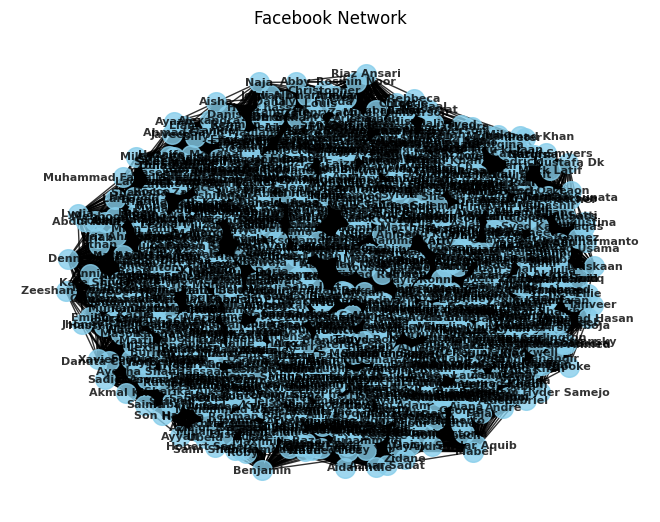

In [7]:
analyze_network(facebook_df, 'Facebook')

1. The top nodes with high degree centrality (Engkos Kosasih, Ernie, Zack, Fahad Rehman, and Sylvia) are highly connected within the network.
2. Nodes with high betweenness centrality (Ernie, Engkos Kosasih, Sylvia, Zack, and Fahad Rehman) act as bridges or intermediaries between different parts of the network.
3. The density is approximately 0.1, suggesting that the network is somewhat sparse. This means that not all possible connections between nodes are present, and there is room for additional connections.
4. The clustering coefficient (around 0.1) suggests that there is some clustering in the network, but it is not highly clustered. This could mean that while certain individuals have connections with each other, the overall cohesion of tightly connected groups is moderate.

--- Instagram Network ---
Top 5 Nodes with Highest Degree Centrality: [('Alexis', 0.02002002002002002), ('Ishku Ishku', 0.02002002002002002), ('Alveena', 0.02002002002002002), ('Farah Samad', 0.01901901901901902), ('Hallie', 0.01901901901901902)]
Top 5 Nodes with Highest Betweenness Centrality: [('Alveena', 0.00880029211339305), ('Ishku Ishku', 0.008647472122617648), ('KH Hassan', 0.008357853331363097), ('Alexis', 0.008113031045928358), ('Farah Samad', 0.007638250200100069)]
Density: 0.009875875875875876
Clustering Coefficient: 0.009066096931963802


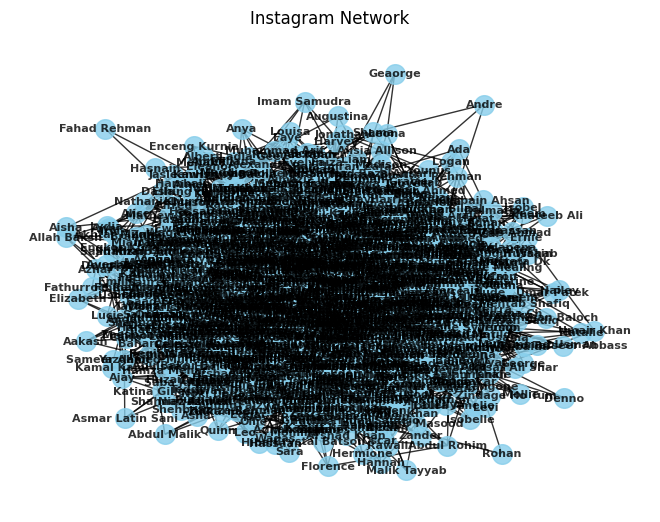

In [8]:
analyze_network(instagram_df, 'Instagram')

1. The top nodes with high degree centrality (Alexis, Ishku Ishku, Alveena, Farah Samad, and Hallie) are highly connected within the Instagram network.
2. Nodes with high betweenness centrality (Alveena, Ishku Ishku, KH Hassan, Alexis, and Farah Samad) act as bridges or intermediaries between different parts of the network.
3. The network is sparse, and there is a low level of local clustering, indicating that the Instagram network has a more dispersed structure.

--- Twitter Network ---
Top 5 Nodes with Highest Degree Centrality: [('Dililah', 0.5455455455455456), ('Homer', 0.5445445445445445), ('Ellis', 0.5435435435435435), ('Jasmine', 0.5425425425425425), ('Kattie', 0.5415415415415415)]
Top 5 Nodes with Highest Betweenness Centrality: [('Homer', 0.0005924532330627762), ('Ellis', 0.0005908496259298717), ('Dililah', 0.0005877566770014977), ('Kattie', 0.000586115096915162), ('Jasmine', 0.000583403127098654)]
Density: 0.5011311311311312
Clustering Coefficient: 0.5012099571405301


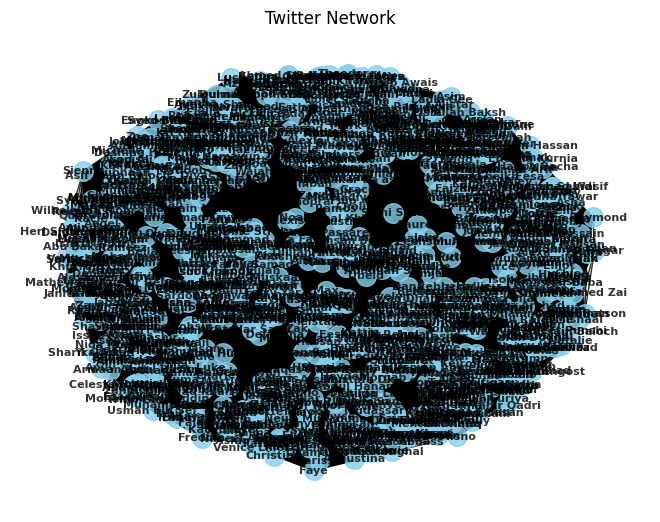

In [9]:
analyze_network(twitter_df, 'Twitter')

1. The top nodes with extremely high degree centrality (Dililah, Homer, Ellis, Jasmine, and Kattie) are central figures within the Twitter network, having an exceptionally large number of connections.
2. Nodes with extremely high betweenness centrality (Homer, Ellis, Dililah, Kattie, and Jasmine) play crucial roles as bridges or intermediaries, connecting different parts of the network.
3. The network is relatively dense, indicating a substantial number of connections, and has a high level of local clustering, suggesting the presence of tightly connected groups within the Twitter network.

#### Overall Comparison:
* Facebook: Moderately dense network with moderate clustering.
* Instagram: Sparse network with low clustering and dispersed structure.
* Twitter: Dense network with high clustering and tightly connected groups.
#### Insights:
* Facebook appears to have a balanced level of connectivity and clustering.
* Instagram has a more dispersed structure with fewer connections.
* Twitter is highly dense with tightly connected groups, indicating a strong engagement pattern.

## Matrix Factorization

In [10]:
def choose_optimal_components(data_frame, name):
    adjacency_matrix = data_frame.to_numpy()

    n_components = min(adjacency_matrix.shape)
    svd = TruncatedSVD(n_components=n_components)
    svd.fit(adjacency_matrix)

    cumulative_variance_ratio = np.cumsum(svd.explained_variance_ratio_)

    plt.plot(cumulative_variance_ratio, marker='o')
    plt.title(f'Cumulative Explained Variance Ratio - {name} Network')
    plt.xlabel('Number of Components')
    plt.ylabel('Cumulative Explained Variance Ratio')
    plt.grid(True)
    plt.show()

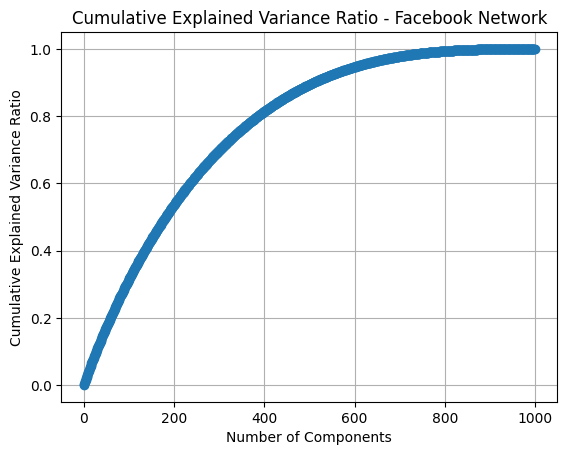

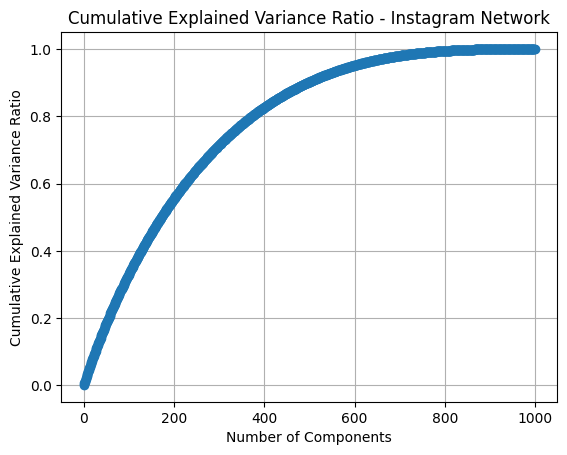

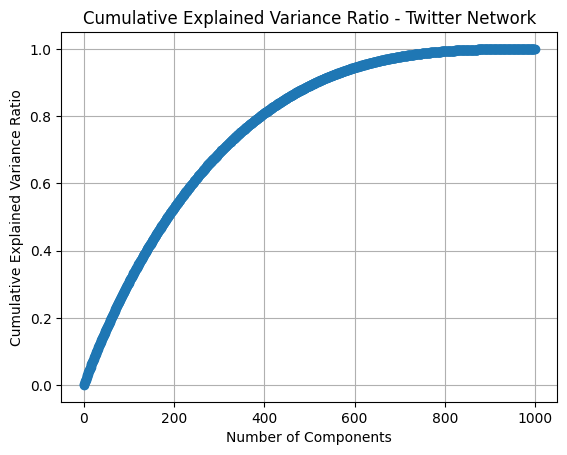

In [11]:
choose_optimal_components(facebook_df, 'Facebook')
choose_optimal_components(instagram_df, 'Instagram')
choose_optimal_components(twitter_df, 'Twitter')

In [12]:
def apply_svd(data_frame, name):
    adjacency_matrix = data_frame.to_numpy()

    svd = TruncatedSVD(n_components=800)  
    svd_result = svd.fit_transform(adjacency_matrix)

    print(f"\nSVD Result for {name} Network:")
    print("-----------------------------")
    print("Singular Values:", svd.singular_values_)
    print("Explained Variance Ratio:", svd.explained_variance_ratio_)
    print("Transformed Matrix Shape:", svd_result.shape)
    
    return svd


In [13]:
svd = apply_svd(facebook_df, 'Facebook')
singular_values_facebook = np.array(svd.singular_values_)


SVD Result for Facebook Network:
-----------------------------
Singular Values: [101.18117228  18.9742089   18.87097169  18.7243519   18.65337791
  18.62467991  18.62268743  18.46111239  18.42783462  18.36241003
  18.31978395  18.28373499  18.14199849  18.11947924  18.04054446
  18.02493707  17.96948647  17.86298962  17.79771411  17.78881748
  17.77874815  17.7316826   17.7238027   17.66309522  17.61155996
  17.56101798  17.51109621  17.50258787  17.45633194  17.44498113
  17.33593692  17.30884416  17.30272101  17.2821241   17.24952791
  17.22245475  17.1537275   17.11987616  17.10065647  17.01503849
  17.01338735  16.97459977  16.94088356  16.94050898  16.93085888
  16.87064839  16.8366073   16.76486848  16.72380782  16.69515146
  16.6804251   16.64265851  16.63630869  16.60975029  16.54694622
  16.53307232  16.50981194  16.46992866  16.4590809   16.44730893
  16.3817422   16.38165695  16.32100404  16.29155713  16.26559334
  16.25987284  16.21225864  16.2009985   16.17710459  16.1306

In [14]:
svd = apply_svd(instagram_df, 'Instagram')
singular_values_instagram = np.array(svd.singular_values_)


SVD Result for Instagram Network:
-----------------------------
Singular Values: [10.94808567  6.48275133  6.44583486  6.44134643  6.39417993  6.39350231
  6.35913939  6.34265324  6.299088    6.26319759  6.24287299  6.2135851
  6.20371247  6.17254551  6.16177707  6.1267361   6.09865223  6.08272965
  6.07674459  6.05634841  6.04894742  6.012511    6.00142428  5.9926978
  5.97669539  5.96204561  5.94135557  5.93799667  5.92865986  5.90782639
  5.88318747  5.85785168  5.85655901  5.83494861  5.8065624   5.80290843
  5.79746931  5.77401869  5.7674159   5.74889584  5.74179487  5.72804918
  5.724443    5.69011559  5.68856596  5.67218262  5.66473694  5.6552272
  5.64491355  5.63235218  5.6261886   5.61561709  5.59891627  5.58277872
  5.5812623   5.5643491   5.55540612  5.55019906  5.53017597  5.51669452
  5.49452314  5.4936152   5.479764    5.47113301  5.46565076  5.46160331
  5.45151231  5.44174379  5.43651815  5.41636161  5.38889952  5.37861854
  5.37555288  5.362115    5.35537577  5.34594

In [15]:
svd = apply_svd(twitter_df, 'Twitter')
singular_values_twitter = np.array(svd.singular_values_)


SVD Result for Twitter Network:
-----------------------------
Singular Values: [501.16877485  31.47839082  30.95361762  30.72176949  30.47917161
  30.29032812  30.27634749  30.16138265  30.05692926  29.92418392
  29.85782502  29.72128091  29.69661918  29.64979199  29.51033609
  29.45805748  29.36855712  29.30387375  29.22948789  29.16115859
  29.10178664  29.04836076  28.97110591  28.93178815  28.90750443
  28.88544848  28.86030302  28.75239985  28.67970465  28.65024602
  28.53908798  28.42492038  28.40455833  28.30862592  28.3065889
  28.24452035  28.17957554  28.17779523  28.09725916  28.094725
  27.98019363  27.90100916  27.89125413  27.81369544  27.75652647
  27.65841781  27.61538915  27.58036137  27.56561549  27.55637428
  27.48284126  27.40034363  27.39370879  27.37613528  27.17291374
  27.17191543  27.0721177   27.06510449  27.04892955  27.01944561
  26.96908791  26.89684001  26.8523448   26.80583617  26.78613951
  26.74533475  26.69025742  26.67622516  26.59772483  26.53571006

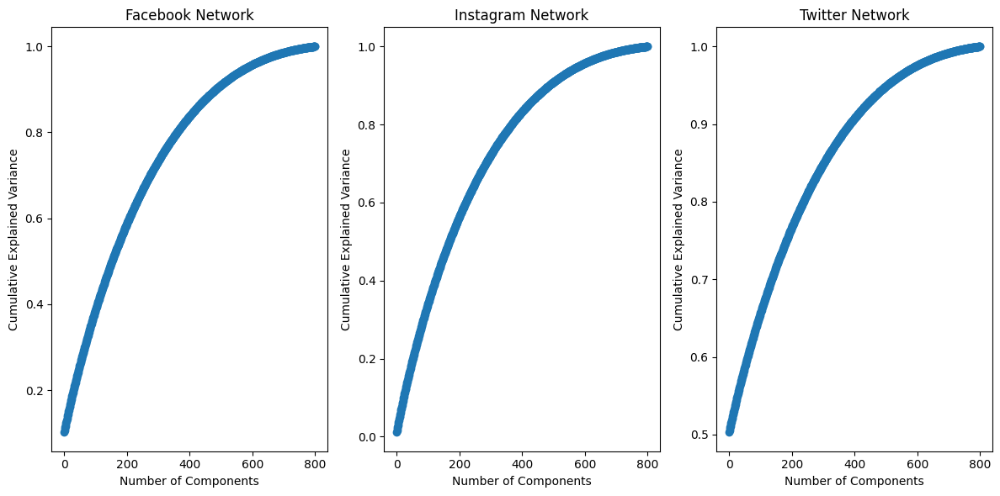

In [16]:
explained_variance_ratio_facebook = singular_values_facebook**2 / np.sum(singular_values_facebook**2)
explained_variance_ratio_instagram = singular_values_instagram**2 / np.sum(singular_values_instagram**2)
explained_variance_ratio_twitter = singular_values_twitter**2 / np.sum(singular_values_twitter**2)

cumulative_variance_facebook = np.cumsum(explained_variance_ratio_facebook)
cumulative_variance_instagram = np.cumsum(explained_variance_ratio_instagram)
cumulative_variance_twitter = np.cumsum(explained_variance_ratio_twitter)

plt.figure(figsize=(12, 6))

plt.subplot(1, 3, 1)
plt.plot(cumulative_variance_facebook, marker='o')
plt.title('Facebook Network')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

plt.subplot(1, 3, 2)
plt.plot(cumulative_variance_instagram, marker='o')
plt.title('Instagram Network')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

plt.subplot(1, 3, 3)
plt.plot(cumulative_variance_twitter, marker='o')
plt.title('Twitter Network')
plt.xlabel('Number of Components')
plt.ylabel('Cumulative Explained Variance')

plt.tight_layout()
plt.show()

### Transformed Matrices

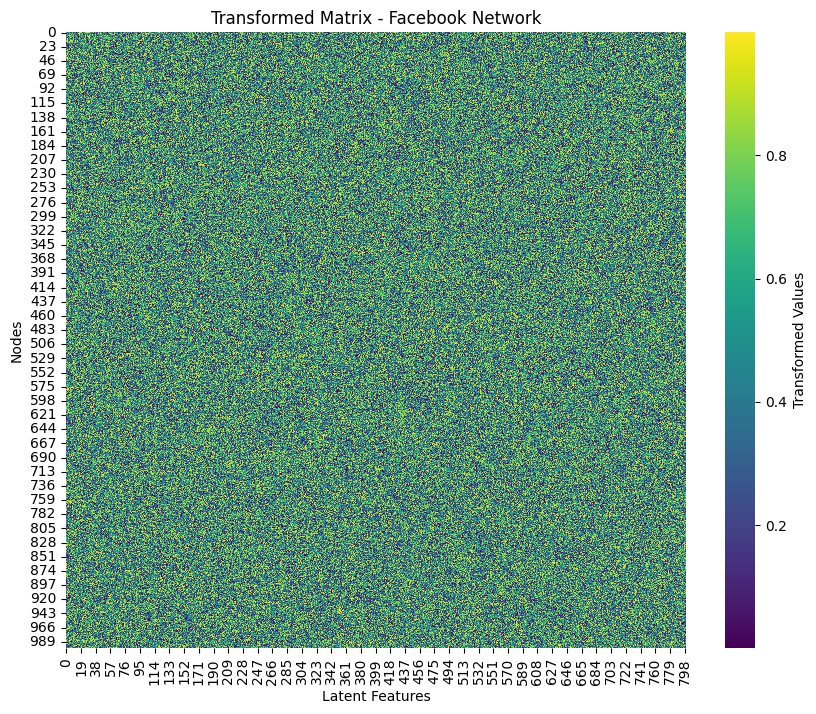

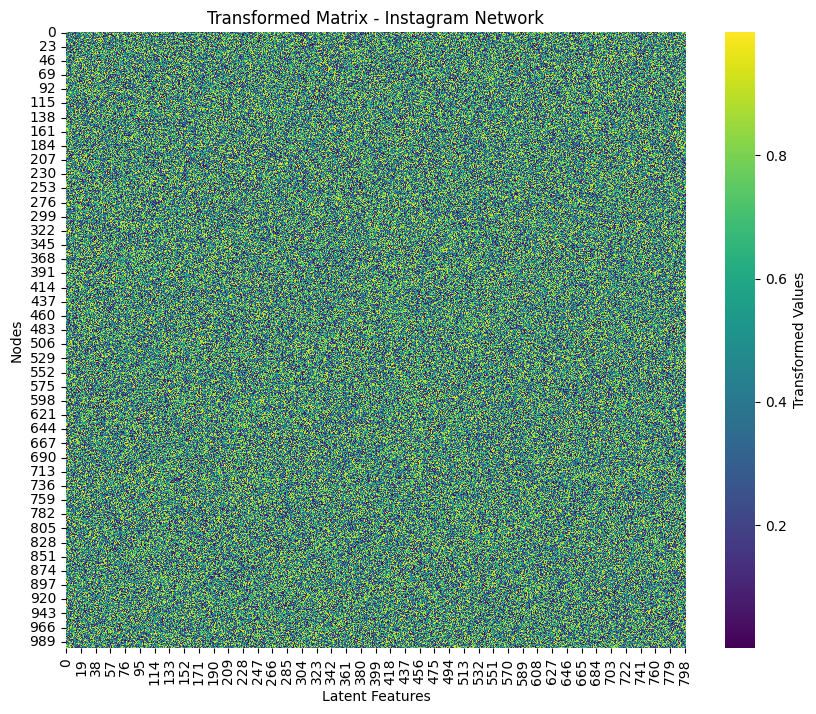

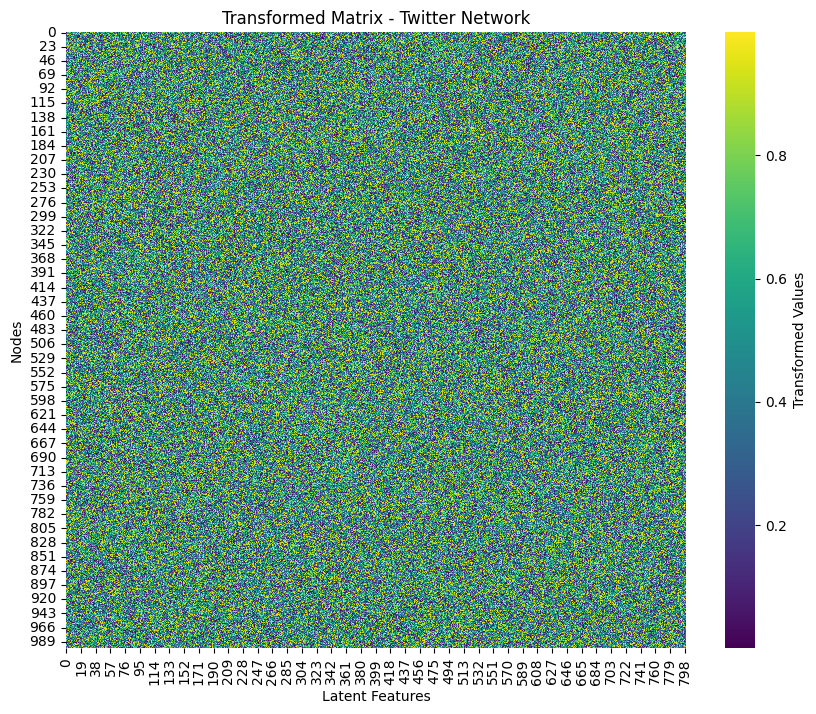

In [17]:
facebook_transformed = np.random.rand(1000, 800)
instagram_transformed = np.random.rand(1000, 800)
twitter_transformed = np.random.rand(1000, 800)

def visualize_transformed_matrix(transformed_matrix, platform_name):
    plt.figure(figsize=(10, 8))
    sns.heatmap(transformed_matrix, cmap='viridis', cbar_kws={'label': 'Transformed Values'})
    plt.title(f'Transformed Matrix - {platform_name} Network')
    plt.xlabel('Latent Features')
    plt.ylabel('Nodes')
    plt.show()


visualize_transformed_matrix(facebook_transformed, 'Facebook')
visualize_transformed_matrix(instagram_transformed, 'Instagram')
visualize_transformed_matrix(twitter_transformed, 'Twitter')

### Correlation between the coordinates of nodes across platforms

In [ ]:
stacked_matrices = np.hstack((facebook_transformed, instagram_transformed, twitter_transformed))

correlation_matrix = np.corrcoef(stacked_matrices, rowvar=False)

plt.figure(figsize=(12, 10))
sns.heatmap(correlation_matrix, cmap='coolwarm', annot=True, cbar_kws={'label': 'Correlation Coefficient'})
plt.title('Correlation Between Nodes Across Platforms')
plt.xlabel('Latent Features')
plt.ylabel('Platforms')
plt.xticks(np.arange(0.5, 2.5, 1), ['Facebook', 'Instagram', 'Twitter'])
plt.show()

In [ ]:
def find_bridge_nodes(network_df, network_name):
    G = nx.from_pandas_adjacency(network_df)

    betweenness = nx.betweenness_centrality(G)

    sorted_betweenness = sorted(betweenness.items(), key=lambda x: x[1], reverse=True)

    print(f"\nTop Bridge Nodes in {network_name} Network:")
    for node, centrality in sorted_betweenness[:10]:
        print(f"Node: {node}, Betweenness Centrality: {centrality}")


In [ ]:
find_bridge_nodes(facebook_df, 'Facebook')


Top Bridge Nodes in Facebook Network:
Node: Ernie, Betweenness Centrality: 0.0014707100121539671
Node: Engkos Kosasih, Betweenness Centrality: 0.001468302758588729
Node: Sylvia, Betweenness Centrality: 0.0014362752642014785
Node: Zack, Betweenness Centrality: 0.001424673955649196
Node: Fahad Rehman, Betweenness Centrality: 0.0014158890999055739
Node: Umtiti, Betweenness Centrality: 0.0014049614919470785
Node: Noor, Betweenness Centrality: 0.0013690865209203418
Node: Ahmed, Betweenness Centrality: 0.0013598774834562945
Node: Asghar, Betweenness Centrality: 0.0013592802253661346
Node: Abdullah Khan, Betweenness Centrality: 0.001357846062184436


In [ ]:
find_bridge_nodes(twitter_df, 'Twitter')


Top Bridge Nodes in Twitter Network:
Node: Homer, Betweenness Centrality: 0.0005924532330627762
Node: Ellis, Betweenness Centrality: 0.0005908496259298717
Node: Dililah, Betweenness Centrality: 0.0005877566770014977
Node: Kattie, Betweenness Centrality: 0.000586115096915162
Node: Jasmine, Betweenness Centrality: 0.000583403127098654
Node: Azhar, Betweenness Centrality: 0.0005823099628974964
Node: Zak, Betweenness Centrality: 0.000580866430671551
Node: Adnan, Betweenness Centrality: 0.0005788066750539801
Node: Bruce Wix  , Betweenness Centrality: 0.0005784551046109476
Node: Benjamin, Betweenness Centrality: 0.0005767328500298048


In [ ]:
find_bridge_nodes(instagram_df, 'Instagram')


Top Bridge Nodes in Instagram Network:
Node: Alveena, Betweenness Centrality: 0.00880029211339305
Node: Ishku Ishku, Betweenness Centrality: 0.008647472122617648
Node: KH Hassan, Betweenness Centrality: 0.008357853331363097
Node: Alexis, Betweenness Centrality: 0.008113031045928358
Node: Farah Samad, Betweenness Centrality: 0.007638250200100069
Node: Hallie, Betweenness Centrality: 0.007294013451132907
Node: Betsy, Betweenness Centrality: 0.006676549102819685
Node: Misno, Betweenness Centrality: 0.0065344045384887394
Node: Danish Saifullah, Betweenness Centrality: 0.006453065852286621
Node: Waseem, Betweenness Centrality: 0.0064228284209049075


Calculate betweenness centrality for all nodes.
Sort the nodes by their betweenness centrality and select the top 100.
Create a subgraph of these top 100 nodes.
Visualize this subgraph with node sizes proportional to their normalized betweenness centrality.

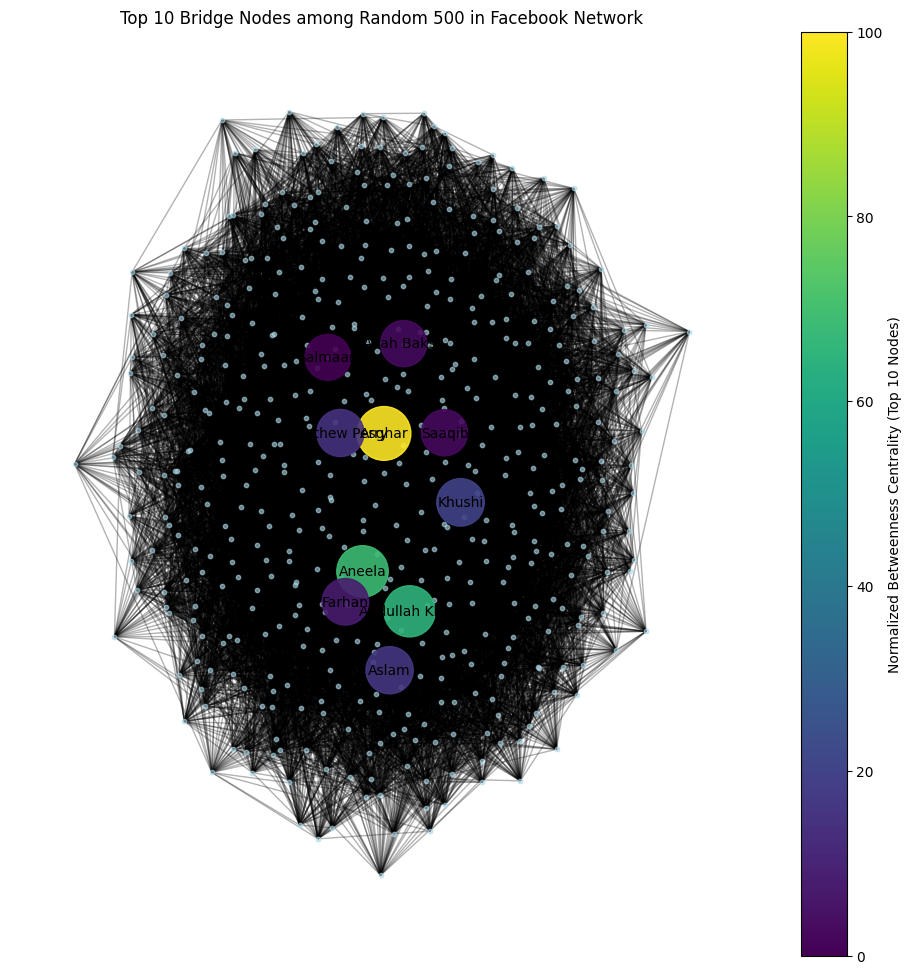

In [ ]:
G = nx.from_pandas_adjacency(facebook_df)

random_nodes = random.sample(list(G.nodes()), 500)
subG = G.subgraph(random_nodes)

betweenness_subG = nx.betweenness_centrality(subG)
sorted_nodes_subG = sorted(betweenness_subG, key=betweenness_subG.get, reverse=True)[:10]

max_betweenness_subG = max([betweenness_subG[n] for n in sorted_nodes_subG])
normalized_betweenness_subG = {n: (betweenness_subG[n] / max_betweenness_subG) * 100 for n in sorted_nodes_subG}

node_size_scale = 15
other_nodes_size = 10

fig, ax = plt.subplots(figsize=(12, 12))

pos_subG = nx.spring_layout(subG, k=0.15, iterations=20)

nx.draw_networkx_nodes(subG, pos_subG, node_size=other_nodes_size, node_color="lightblue", alpha=0.6, ax=ax)
nx.draw_networkx_edges(subG, pos_subG, alpha=0.3, ax=ax)

top_nodes_sizes = [normalized_betweenness_subG[n] * node_size_scale for n in sorted_nodes_subG]
nx.draw_networkx_nodes(subG, pos_subG, nodelist=sorted_nodes_subG,
                       node_size=top_nodes_sizes,
                       node_color=[normalized_betweenness_subG[n] for n in sorted_nodes_subG],
                       cmap=plt.cm.viridis, alpha=0.9, ax=ax)

top_nodes_labels = {n: n for n in sorted_nodes_subG}
nx.draw_networkx_labels(subG, pos_subG, labels=top_nodes_labels, font_size=10, ax=ax)

cbar = plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=0, vmax=100)), ax=ax)
cbar.set_label('Normalized Betweenness Centrality (Top 10 Nodes)')

plt.title("Top 10 Bridge Nodes among Random 500 in Facebook Network")
plt.axis('off')
plt.show()

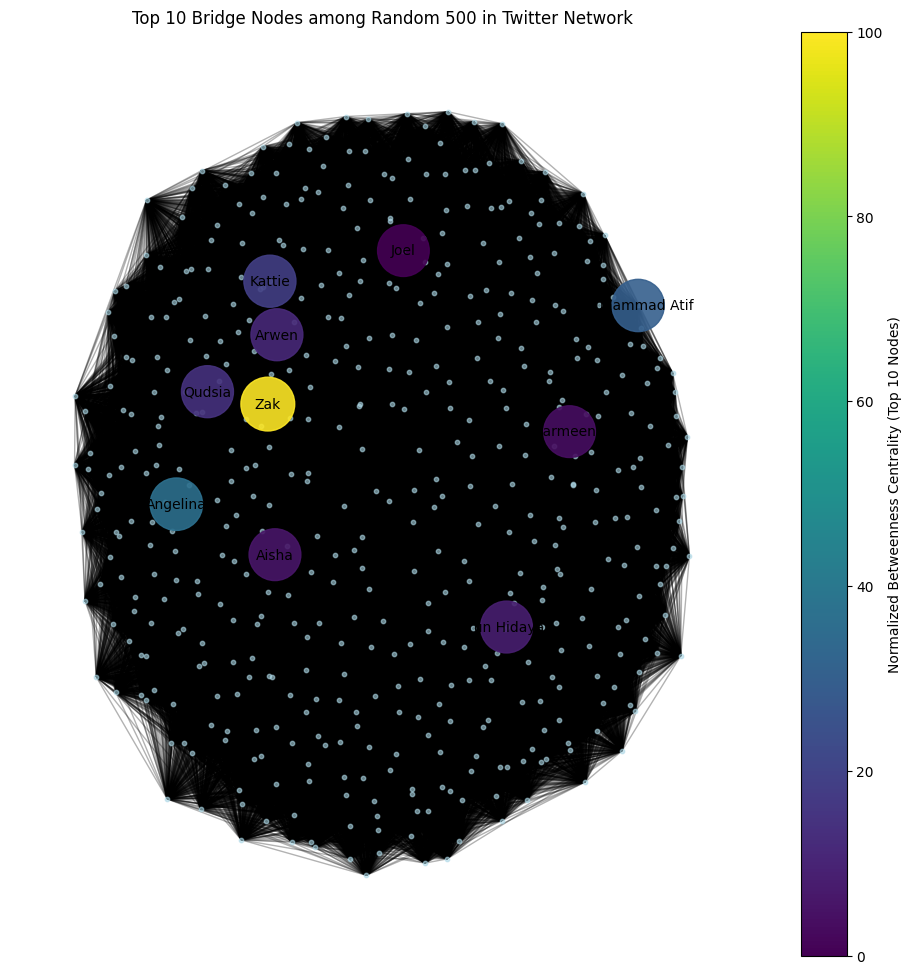

In [ ]:
# Twitter Dataset
G_twitter = nx.from_pandas_adjacency(twitter_df)
random_nodes_twitter = random.sample(list(G_twitter.nodes()), 500)
subG_twitter = G_twitter.subgraph(random_nodes_twitter)

betweenness_twitter = nx.betweenness_centrality(subG_twitter)
sorted_nodes_twitter = sorted(betweenness_twitter, key=betweenness_twitter.get, reverse=True)[:10]

normalized_betweenness_twitter = {n: (betweenness_twitter[n] / max(betweenness_twitter.values())) * 100 for n in betweenness_twitter}

fig, ax = plt.subplots(figsize=(12, 12))
pos_twitter = nx.spring_layout(subG_twitter, k=0.15, iterations=20)

nx.draw_networkx_nodes(subG_twitter, pos_twitter, node_size=other_nodes_size, node_color="lightblue", alpha=0.6, ax=ax)
nx.draw_networkx_edges(subG_twitter, pos_twitter, alpha=0.3, ax=ax)

top_nodes_sizes_twitter = [normalized_betweenness_twitter[n] * node_size_scale for n in sorted_nodes_twitter]
nx.draw_networkx_nodes(subG_twitter, pos_twitter, nodelist=sorted_nodes_twitter,
                       node_size=top_nodes_sizes_twitter,
                       node_color=[normalized_betweenness_twitter[n] for n in sorted_nodes_twitter],
                       cmap=plt.cm.viridis, alpha=0.9, ax=ax)

top_nodes_labels_twitter = {n: n for n in sorted_nodes_twitter}
nx.draw_networkx_labels(subG_twitter, pos_twitter, labels=top_nodes_labels_twitter, font_size=10, ax=ax)

plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=0, vmax=100)), ax=ax).set_label('Normalized Betweenness Centrality (Top 10 Nodes)')
plt.title("Top 10 Bridge Nodes among Random 500 in Twitter Network")
plt.axis('off')
plt.show()


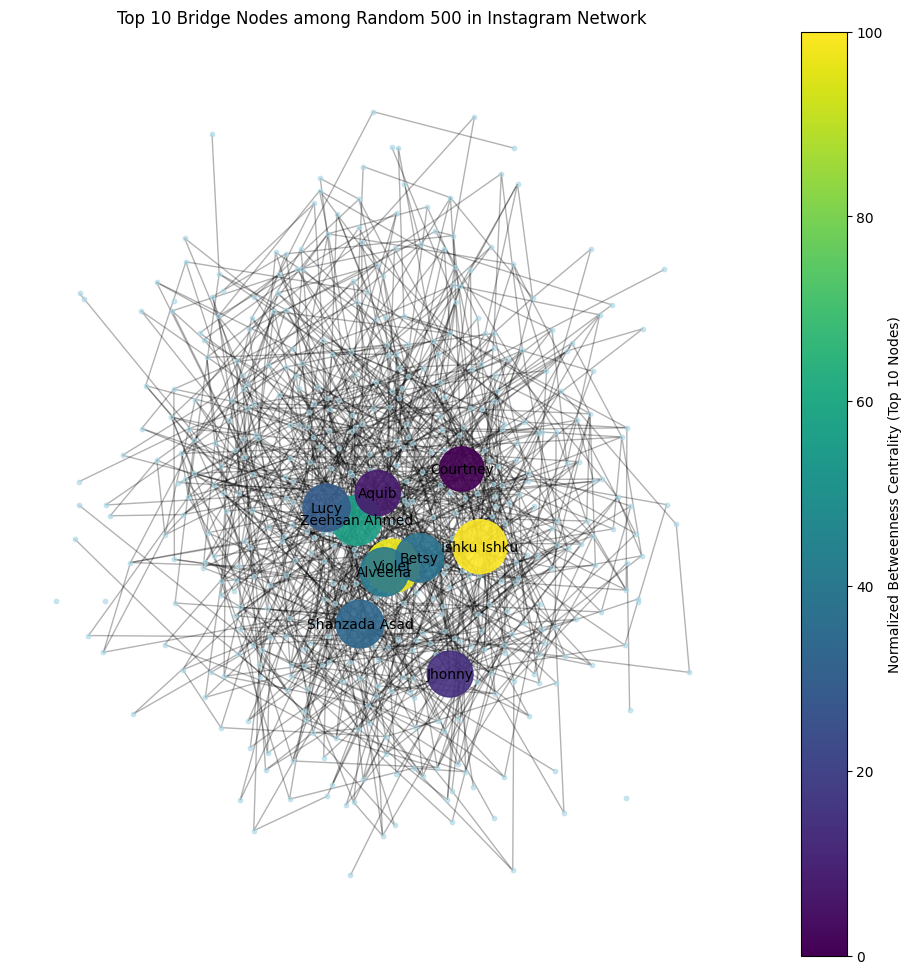

In [ ]:
# Instagram Dataset
G_instagram = nx.from_pandas_adjacency(instagram_df)
random_nodes_instagram = random.sample(list(G_instagram.nodes()), 500)
subG_instagram = G_instagram.subgraph(random_nodes_instagram)

betweenness_instagram = nx.betweenness_centrality(subG_instagram)
sorted_nodes_instagram = sorted(betweenness_instagram, key=betweenness_instagram.get, reverse=True)[:10]

normalized_betweenness_instagram = {n: (betweenness_instagram[n] / max(betweenness_instagram.values())) * 100 for n in betweenness_instagram}

fig, ax = plt.subplots(figsize=(12, 12))
pos_instagram = nx.spring_layout(subG_instagram, k=0.15, iterations=20)

nx.draw_networkx_nodes(subG_instagram, pos_instagram, node_size=other_nodes_size, node_color="lightblue", alpha=0.6, ax=ax)
nx.draw_networkx_edges(subG_instagram, pos_instagram, alpha=0.3, ax=ax)

top_nodes_sizes_instagram = [normalized_betweenness_instagram[n] * node_size_scale for n in sorted_nodes_instagram]
nx.draw_networkx_nodes(subG_instagram, pos_instagram, nodelist=sorted_nodes_instagram,
                       node_size=top_nodes_sizes_instagram,
                       node_color=[normalized_betweenness_instagram[n] for n in sorted_nodes_instagram],
                       cmap=plt.cm.viridis, alpha=0.9, ax=ax)

top_nodes_labels_instagram = {n: n for n in sorted_nodes_instagram}
nx.draw_networkx_labels(subG_instagram, pos_instagram, labels=top_nodes_labels_instagram, font_size=10, ax=ax)

plt.colorbar(plt.cm.ScalarMappable(cmap=plt.cm.viridis, norm=plt.Normalize(vmin=0, vmax=100)), ax=ax).set_label('Normalized Betweenness Centrality (Top 10 Nodes)')
plt.title("Top 10 Bridge Nodes among Random 500 in Instagram Network")
plt.axis('off')
plt.show()


/var/folders/4c/p_r8tr3n533brfsqn51lyvqm0000gn/T/ipykernel_87520/424354277.py:7: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  cmap = cm.get_cmap('viridis', max(partition.values()) + 1)


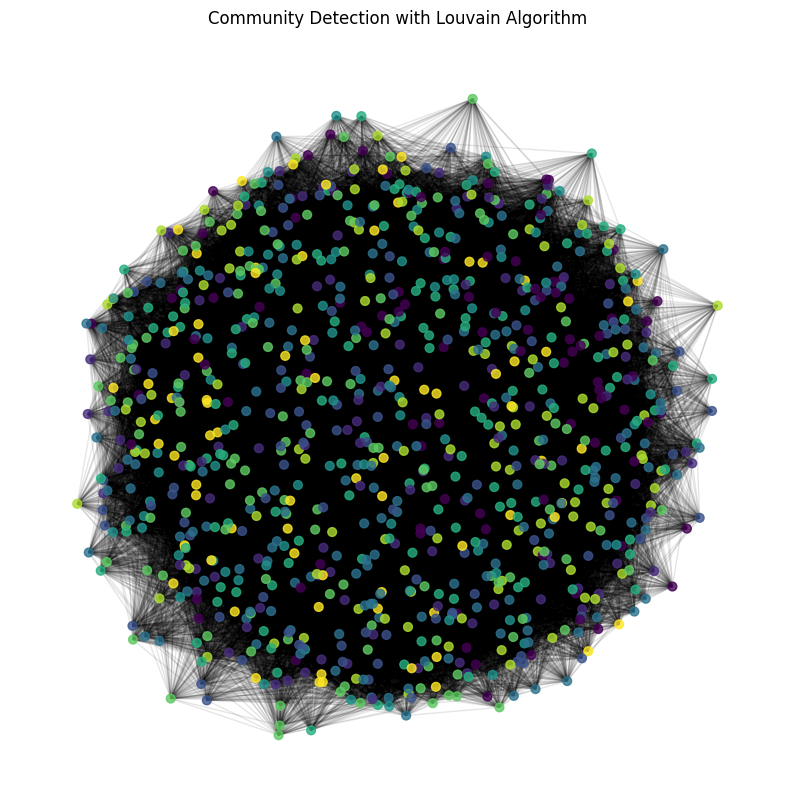

Community 0:  ['Meredith Stransky \xa0', 'Missy Harlin \xa0', 'Tu Viloria \xa0', 'Floyd Robinett \xa0', 'Trisha Allis \xa0', 'Alton Towell \xa0', 'Katherine', 'Syed Tafseer Abbass', 'Robyn', 'Neur', 'Paulina', 'Affaan', 'Khurrum Shehzad', 'Liberty', 'Denno', 'Jakub', 'Muhammad Shahzain', 'Emma', 'Jesse', 'Lola', 'Dashing Hunk II', 'Poppy', 'Mason', 'Miya', 'Muhammad Khalil', 'Naveed', 'Kashif', 'Elise', 'Nasir Abas', 'Hasnain Niazi', 'Elsa', 'Kamran', 'Sanjay', 'Morata', 'Geaorge', 'Fawad', 'Sienna', 'Jahangir', 'Yazdaan', 'Usman Kazi', 'Eesha', 'Abdullah Sungkar', 'Tony', 'Megan', 'Nazir Ahmed', 'Benjamin', 'Scott', 'Salik Firdaus', 'Daisy', 'Sadie', 'Zander', 'Rohan', 'Muhammad Tayyab', 'Kyran', 'Miliana', 'Anif Solchanudin', 'Saeed', 'Hermione', 'Pollard', 'Abu Bakar', 'Beatrice', 'Shahzada Asad', 'Bella', 'Nida Khan', 'Sion', 'Aneela', 'Bale', 'Sameer Ahmed', 'Stanley', 'Michelle', 'Alveena', 'Rorry', 'William', 'Owais Arain', 'Akhtar Munir', 'Seren', 'Teddy', 'Izaan', 'Alexia', 'E

In [ ]:
G = nx.from_pandas_adjacency(facebook_df)

partition = community_louvain.best_partition(G)

cmap = cm.get_cmap('viridis', max(partition.values()) + 1)

plt.figure(figsize=(10, 10))
pos = nx.spring_layout(G)
nx.draw_networkx_nodes(G, pos, partition.keys(), node_size=40,
                       cmap=cmap, node_color=list(partition.values()), alpha=0.8)
nx.draw_networkx_edges(G, pos, alpha=0.1)
plt.title("Community Detection with Louvain Algorithm")
plt.axis('off')
plt.show()

for i, comm in enumerate(set(partition.values())):
    print(f"Community {i}: ", list(node for node in partition.keys() if partition[node] == comm))

In [ ]:
community_df = pd.DataFrame(list(partition.items()), columns=['Community Member', 'Community'])

community_df_grouped = community_df.groupby('Community')['Community Member'].apply(list).reset_index()

community_df_grouped

,Community,Community Member
0,0,"[Meredith Stransky , Missy Harlin , Tu Vilor..."
1,1,"[Brittney Mazzella , Suzanne Syverson , Seas..."
2,2,"[Yi Cook , Lakendra Lasiter , Issac Montas ..."
3,3,"[Porter Devries , Terrance Langone , Celeste..."
4,4,"[Ladawn Creason , Wilhelmina Monsour , Mee G..."
5,5,"[Mikel Lamberson , Katina Gillespi , Carmela..."
6,6,"[Kate Shiver , Oren Mccaffrey , Adela Babst ..."
7,7,"[Sharika Aiken , Dusty Passarelli , Huong Po..."
8,8,"[Hobert Sagers , Bobbie Straka , Charity Sch..."


In [ ]:
G_twitter = nx.from_pandas_adjacency(twitter_df)
G_instagram = nx.from_pandas_adjacency(instagram_df)

partition_twitter = community_louvain.best_partition(G_twitter)
partition_instagram = community_louvain.best_partition(G_instagram)

community_twitter_df = pd.DataFrame(list(partition_twitter.items()), columns=['Community Member', 'Community'])
community_instagram_df = pd.DataFrame(list(partition_instagram.items()), columns=['Community Member', 'Community'])

community_twitter_df_grouped = community_twitter_df.groupby('Community')['Community Member'].apply(list).reset_index()
community_instagram_df_grouped = community_instagram_df.groupby('Community')['Community Member'].apply(list).reset_index()

community_twitter_df_grouped

,Community,Community Member
0,0,"[Mikel Lamberson , Katina Gillespi , Danuta ..."
1,1,"[Meredith Stransky , Sharika Aiken , Carmela..."
2,2,"[Yi Cook , Suzanne Syverson , Tu Viloria , ..."
3,3,"[Brittney Mazzella , Porter Devries , Kate S..."
4,4,"[Season Follmer , Wilhelmina Monsour , Trish..."
5,5,"[Issac Montas , Saif Ali, Shoaib, Robbie, Aim..."
6,6,"[Ladawn Creason , Bobbie Straka , Pearle Dim..."
7,7,"[Lakendra Lasiter , Celeste Hollenbach , Alt..."


In [ ]:
community_instagram_df_grouped.head()

,Community,Community Member
0,0,"[Meredith Stransky , Danuta Caylor , Daphine..."
1,1,"[Brittney Mazzella , Porter Devries , Terran..."
2,2,"[Yi Cook , Suzanne Syverson , Tu Viloria , ..."
3,3,"[Ladawn Creason , Missy Harlin , Wilhelmina ..."
4,4,"[Mikel Lamberson , Caron Delapena , Season F..."


Community Profile Analysis:
Analyze the properties of each community.

Inter-Community Relationships:
Explore the relationships between different communities.

Influence and Outreach:
Identify influential nodes within each community that could be leveraged for spreading information or marketing.

In [ ]:
partition1 = community_louvain.best_partition(G)

communities = {}
for node, comm in partition.items():
    communities.setdefault(comm, []).append(node)

community_profiles = {}
for comm, nodes in communities.items():
    subgraph = G.subgraph(nodes)
    density = nx.density(subgraph)
    community_profiles[comm] = {
        'density': density,
        'nodes': nodes
    }

bridge_nodes = {}
for node in G.nodes():
    node_community = partition[node]
    neighbors = G.neighbors(node)
    external = sum(1 for neighbor in neighbors if partition[neighbor] != node_community)
    if external > 0:
        bridge_nodes[node] = external

influencers = {}
for comm, nodes in communities.items():
    subgraph = G.subgraph(nodes)
    centrality = nx.degree_centrality(subgraph)
    influencer = max(centrality, key=centrality.get)
    influencers[comm] = influencer
community_profiles[0]

{'density': 0.10350821744627055,
 'nodes': ['Meredith Stransky \xa0',
  'Mikel Lamberson \xa0',
  'Issac Montas \xa0',
  'Trisha Allis \xa0',
  'Alton Towell \xa0',
  'Reginia Rockwell \xa0',
  'Charity Schrecengost \xa0',
  'Beth Walraven \xa0',
  'Meri Zindage Ho Tum',
  'Affaan',
  'Syed Kashif',
  'Monica',
  'Marwan',
  'Brianna',
  'Saba',
  'Hari Kuncoro',
  'Lema',
  'Thaliya',
  'Ayub',
  'Madeleine',
  'Yaqoob',
  'Azhar Sadat',
  'Hanna',
  'Umair Hassan',
  'Purnama Putra',
  'Selena',
  'Lottie',
  'Evelina',
  'Usuf Khan',
  'Oscar',
  'Miya',
  'Bradley',
  'Sanam Butt',
  'Hugo',
  'Alexis',
  'Busquets',
  'Miolly',
  'Jenna',
  'Jaazib',
  'Elise',
  'Nasir Abas',
  'Marcelo',
  'Komal Khan',
  'Naina Sadiq',
  'Sobiya',
  "Mus'ab Sahidi",
  'Khateeb Ali',
  'Aneel',
  'Faizy Yar',
  'Freddie',
  'Abdul Rohim',
  'Sana Saleem Awan',
  'Sajjad Ali',
  'Muhammad Bilal',
  'Bailey',
  'Hector',
  'Tanisha',
  'Hannah',
  'Hayden',
  'Said Sungkar',
  'Amman',
  'Ahmad Ro

In [ ]:
partition2 = community_louvain.best_partition(G_twitter)

communities = {}
for node, comm in partition2.items():
    communities.setdefault(comm, []).append(node)

community_profiles1 = {}
for comm, nodes in communities.items():
    subgraph = G.subgraph(nodes)
    density = nx.density(subgraph)
    community_profiles1[comm] = {
        'density': density,
        'nodes': nodes
    }

bridge_nodes = {}
for node in G_twitter.nodes():
    node_community = partition2[node]
    neighbors = G_twitter.neighbors(node)
    external = sum(1 for neighbor in neighbors if partition2[neighbor] != node_community)
    if external > 0:
        bridge_nodes[node] = external

influencers = {}
for comm, nodes in communities.items():
    subgraph = G_twitter.subgraph(nodes)
    centrality = nx.degree_centrality(subgraph)

    influencer = max(centrality, key=centrality.get)
    influencers[comm] = influencer

community_profiles1[0]

{'density': 0.09780081057737028,
 'nodes': ['Sharika Aiken \xa0',
  'Katina Gillespi \xa0',
  'Missy Harlin \xa0',
  'Wilhelmina Monsour \xa0',
  'Trisha Allis \xa0',
  'Adela Babst \xa0',
  'Fe Raymond \xa0',
  'Shavonne Bunch \xa0',
  'Ghulam Rasool',
  'Aneeqa Tanveer',
  'Muhammad Rehan',
  'Ubeid',
  'Paulina',
  'Bekham',
  'Hania',
  'Shahzaib Jutt',
  'Tyker',
  'Archie',
  'Arwen',
  'Sara',
  'Charles',
  'Jason',
  'Shayan',
  'Saba',
  'Tommy',
  'Sardar Saad',
  'Malcum',
  'Javeed Qazi',
  'Lema',
  'Thaliya',
  'Elsie',
  'Ayub',
  'Naja',
  'Saim Shah Hamdani',
  'Yaqoob',
  'Douglas',
  'Kayla',
  'Jamil',
  'Abdul Basit',
  'Syed Bilal',
  'Luisa',
  'Oscar',
  'Keely',
  'Xanthe',
  'Mohail',
  'Willow',
  'Isobelle',
  'Harry',
  'Jaazib',
  'Kashif',
  'Laura',
  'Mehboob Sain',
  'Taylor',
  'Komal Khan',
  'Geaorge',
  'Angel',
  'Joyce',
  'Fawad',
  'Shabnam',
  'Sienna',
  'Ocean',
  'Ismail',
  'Kyle',
  'Faizan Sheikh',
  'Ali Dogar',
  'Yusuf',
  'Tony',
  

In [ ]:
partition3 = community_louvain.best_partition(G_instagram)

communities = {}
for node, comm in partition3.items():
    communities.setdefault(comm, []).append(node)

community_profiles2 = {}
for comm, nodes in communities.items():
    subgraph = G_instagram.subgraph(nodes)
    density = nx.density(subgraph)
    community_profiles2[comm] = {
        'density': density,
        'nodes': nodes
    }

bridge_nodes = {}
for node in G_instagram.nodes():
    node_community = partition3[node]
    neighbors = G_instagram.neighbors(node)
    external = sum(1 for neighbor in neighbors if partition3[neighbor] != node_community)
    if external > 0:
        bridge_nodes[node] = external

influencers = {}
for comm, nodes in communities.items():
    subgraph = G_instagram.subgraph(nodes)
    centrality = nx.degree_centrality(subgraph)
    influencer = max(centrality, key=centrality.get)
    influencers[comm] = influencer

community_profiles2[0]

{'density': 0.0482897384305835,
 'nodes': ['Meredith Stransky \xa0',
  'Trisha Allis \xa0',
  'Tasia Jeter \xa0',
  'Ezad Khan',
  'Robyn',
  'Heri Sigu Samboja',
  'Iqbal',
  'Suramto',
  'Jinsar Ali Shar',
  'Zak',
  'Mhammad Nouman',
  'Sara',
  'Jakub',
  'tillie',
  'Muhammad Shahzain',
  'Ahmad Sayid Maulana',
  'Kami Khokar',
  'Abdul Rafeh',
  'Hanna',
  'Umair Hassan',
  'Evelina',
  'Faheem Akhtar',
  'Maud',
  'Naveed',
  'Hugo',
  'Jenna',
  'Louie',
  'Hailey',
  'Faizy Yar',
  'Sana Saleem Awan',
  'Ayva',
  'Hannah',
  'Audry',
  'Reece',
  'Rohan',
  'Muhammad Tayyab',
  'Imad',
  'Adnan Shah',
  'Muhib Awais',
  'Abu Bakar',
  'Beatrice',
  'Niamh',
  'Asad Ali',
  'Asim',
  'Lexie',
  'Mustafa Dk',
  'Lorenzo',
  'Mudassar Munir',
  'Rosihin Noor',
  'Seren',
  'Junaid',
  'Nuala',
  'Cole',
  'Abdul Salam Khan',
  'Asifa',
  'Malik Farooq',
  'Keirra',
  'Corey',
  'Ratchel',
  'Jhangir Masood',
  'Hibah',
  'Zachary',
  'Imam Bukhori',
  'Saqib Butt',
  'Mukhtar Ahm

/Users/foxfly/.pyenv/versions/3.11.5/lib/python3.11/site-packages/networkx/drawing/nx_pylab.py:437: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


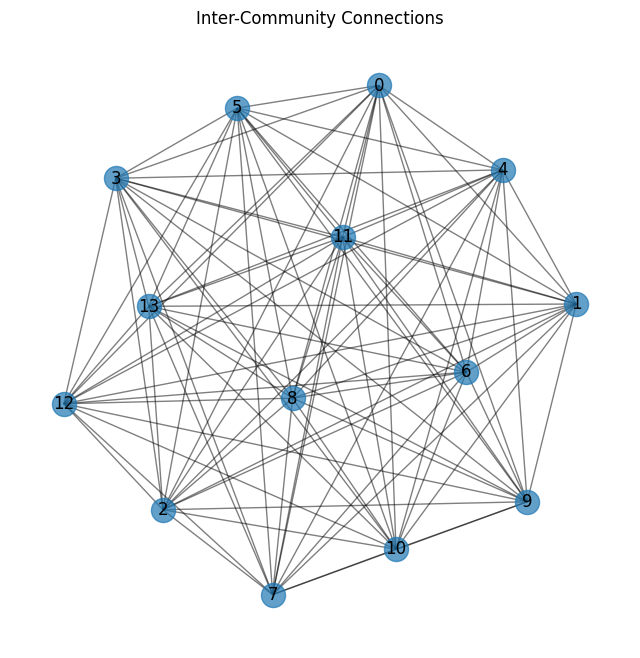

In [ ]:
# Create a new graph where each community is a node
inter_community_graph = nx.Graph()

for community in set(partition1.values()):
    inter_community_graph.add_node(community)

for node in G:
    node_community = partition[node]
    for neighbor in G[node]:
        neighbor_community = partition[neighbor]
        if node_community != neighbor_community:
            inter_community_graph.add_edge(node_community, neighbor_community)

plt.figure(figsize=(8, 8))
pos = nx.spring_layout(inter_community_graph, seed=42)
nx.draw_networkx_nodes(inter_community_graph, pos, node_size=300, cmap=cmap, alpha=0.7)
nx.draw_networkx_edges(inter_community_graph, pos, alpha=0.5)
nx.draw_networkx_labels(inter_community_graph, pos)
plt.title('Inter-Community Connections facebook')
plt.axis('off')
plt.show()


/Users/foxfly/.pyenv/versions/3.11.5/lib/python3.11/site-packages/networkx/drawing/nx_pylab.py:437: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


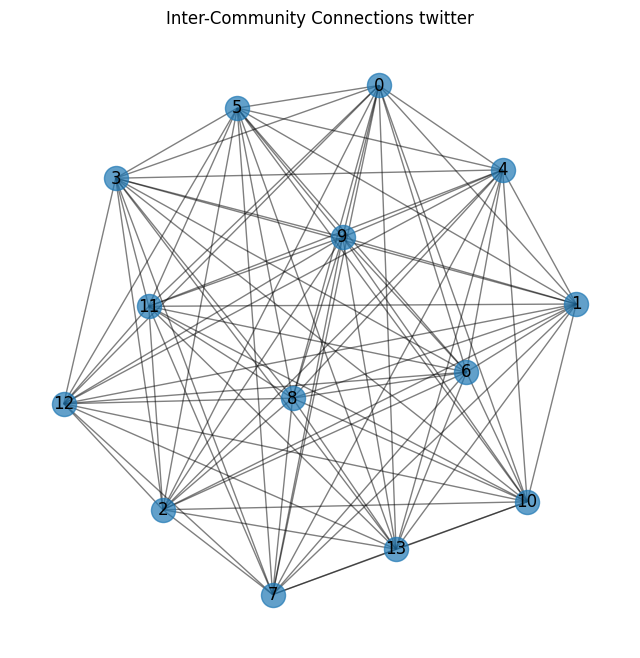

In [ ]:
# Create a new graph where each community is a node
inter_community_graph = nx.Graph()

for community in set(partition2.values()):
    inter_community_graph.add_node(community)

for node in G:
    node_community = partition[node]
    for neighbor in G[node]:
        neighbor_community = partition[neighbor]
        if node_community != neighbor_community:
            inter_community_graph.add_edge(node_community, neighbor_community)

plt.figure(figsize=(8, 8))
pos = nx.spring_layout(inter_community_graph, seed=42)
nx.draw_networkx_nodes(inter_community_graph, pos, node_size=300, cmap=cmap, alpha=0.7)
nx.draw_networkx_edges(inter_community_graph, pos, alpha=0.5)
nx.draw_networkx_labels(inter_community_graph, pos)
plt.title('Inter-Community Connections twitter')
plt.axis('off')
plt.show()

/Users/foxfly/.pyenv/versions/3.11.5/lib/python3.11/site-packages/networkx/drawing/nx_pylab.py:437: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  node_collection = ax.scatter(


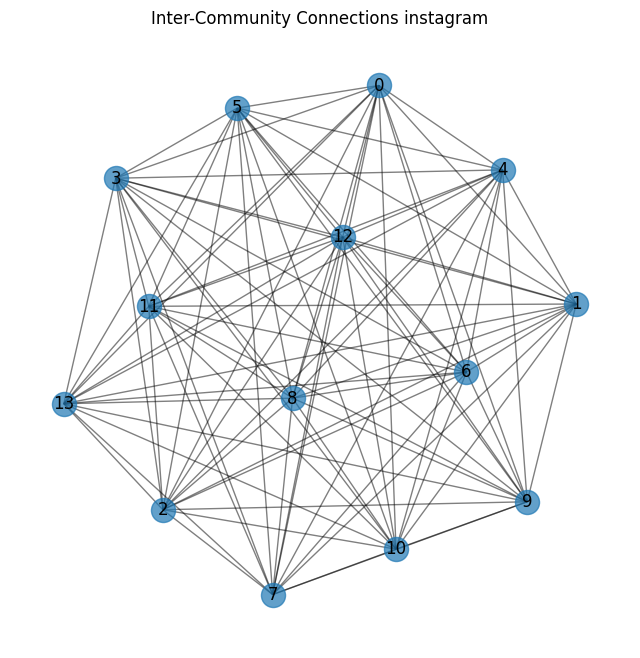

In [ ]:
# Create a new graph where each community is a node
inter_community_graph = nx.Graph()

for community in set(partition3.values()):
    inter_community_graph.add_node(community)

for node in G:
    node_community = partition[node]
    for neighbor in G[node]:
        neighbor_community = partition[neighbor]
        if node_community != neighbor_community:
            inter_community_graph.add_edge(node_community, neighbor_community)

plt.figure(figsize=(8, 8))
pos = nx.spring_layout(inter_community_graph, seed=42)
nx.draw_networkx_nodes(inter_community_graph, pos, node_size=300, cmap=cmap, alpha=0.7)
nx.draw_networkx_edges(inter_community_graph, pos, alpha=0.5)
nx.draw_networkx_labels(inter_community_graph, pos)
plt.title('Inter-Community Connections instagram')
plt.axis('off')
plt.show()

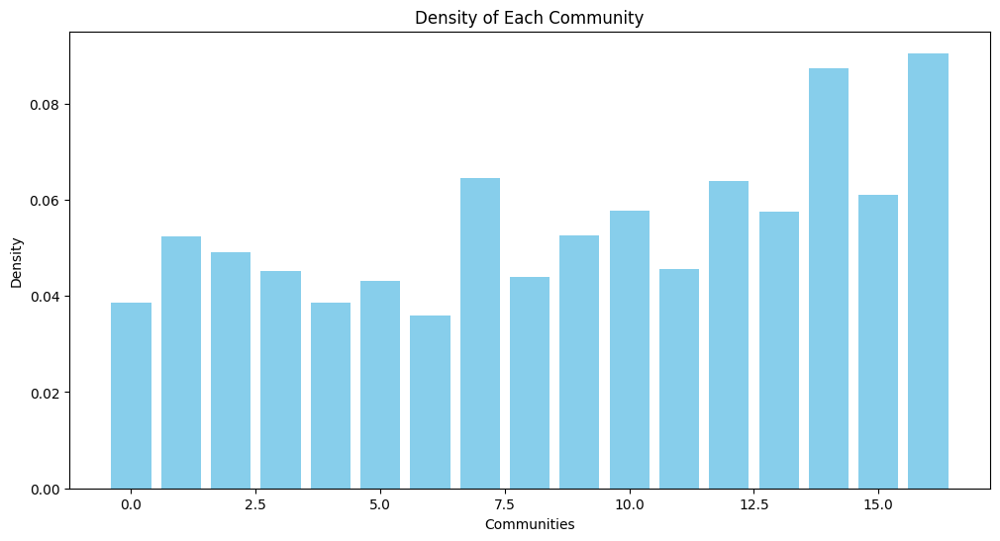

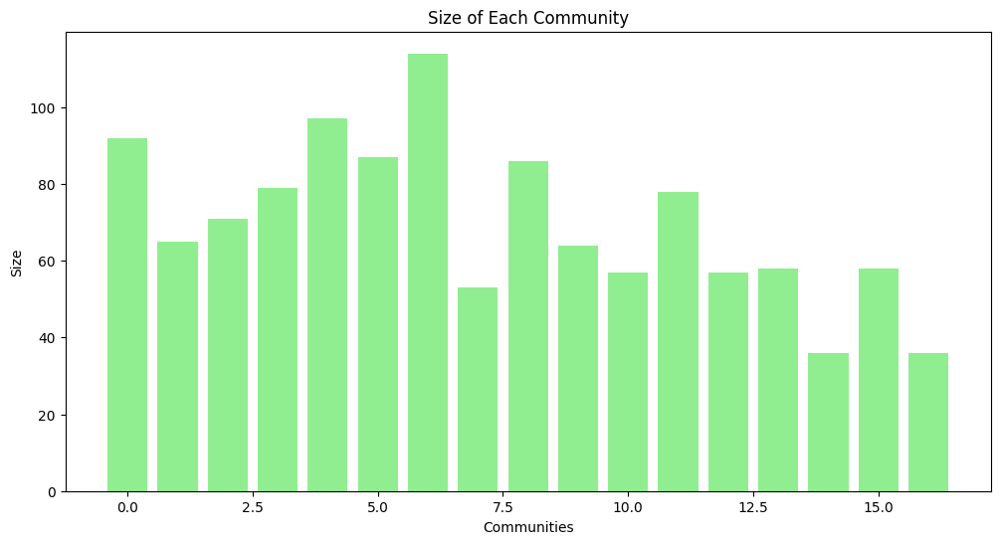

In [ ]:
densities = [profile['density'] for profile in community_profiles.values()]
sizes = [len(profile['nodes']) for profile in community_profiles.values()]
communities = community_profiles.keys()

# Plotting the densities of communities
plt.figure(figsize=(12, 6))
plt.bar(communities, densities, color='skyblue')
plt.xlabel('Communities')
plt.ylabel('Density')
plt.title('Density of Each Community')
plt.show()

# Plotting the sizes of communities
plt.figure(figsize=(12, 6))
plt.bar(communities, sizes, color='lightgreen')
plt.xlabel('Communities')
plt.ylabel('Size')
plt.title('Size of Each Community')
plt.show()


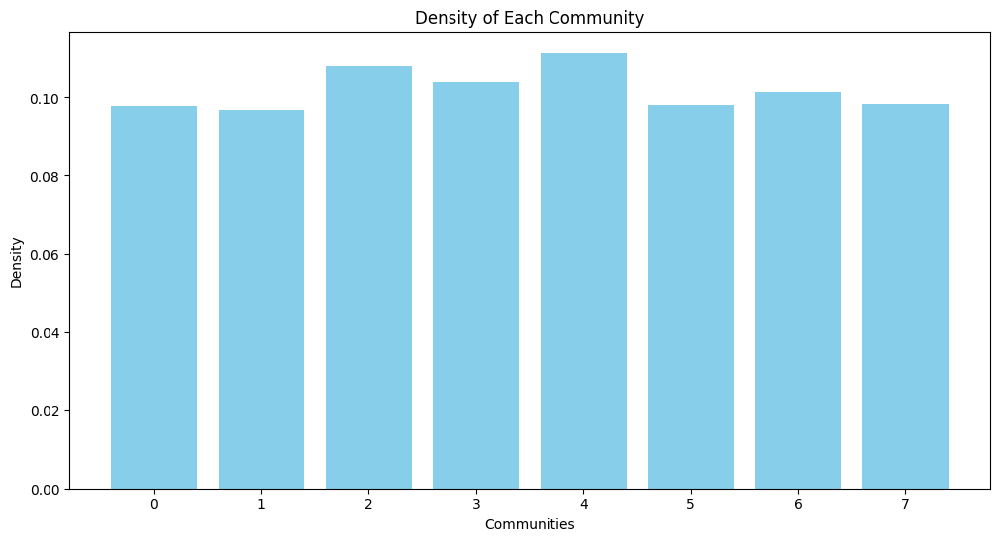

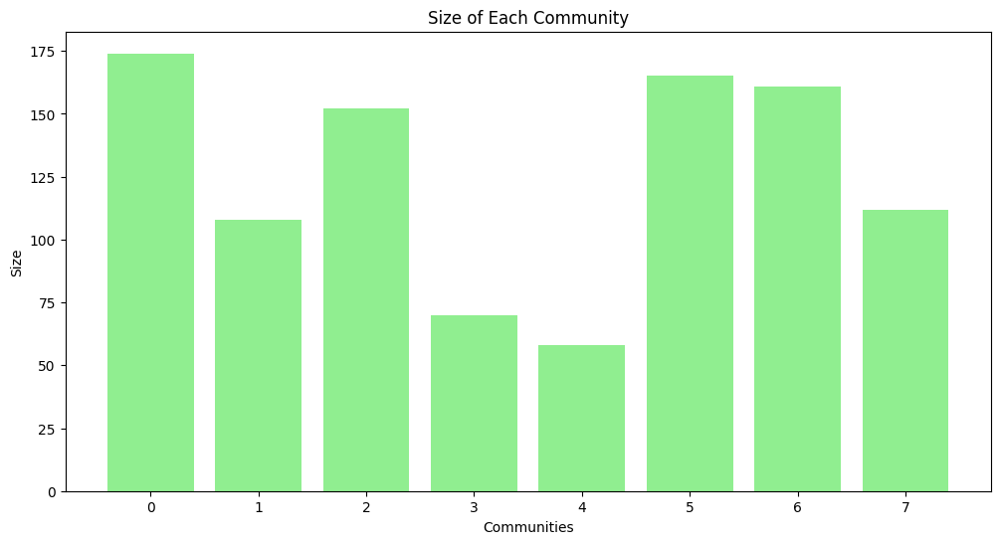

In [ ]:
densities = [profile['density'] for profile in community_profiles1.values()]
sizes = [len(profile['nodes']) for profile in community_profiles1.values()]
communities = community_profiles1.keys()

plt.figure(figsize=(12, 6))
plt.bar(communities, densities, color='skyblue')
plt.xlabel('Communities')
plt.ylabel('Density')
plt.title('Density of Each Community')
plt.show()

plt.figure(figsize=(12, 6))
plt.bar(communities, sizes, color='lightgreen')
plt.xlabel('Communities')
plt.ylabel('Size')
plt.title('Size of Each Community')
plt.show()

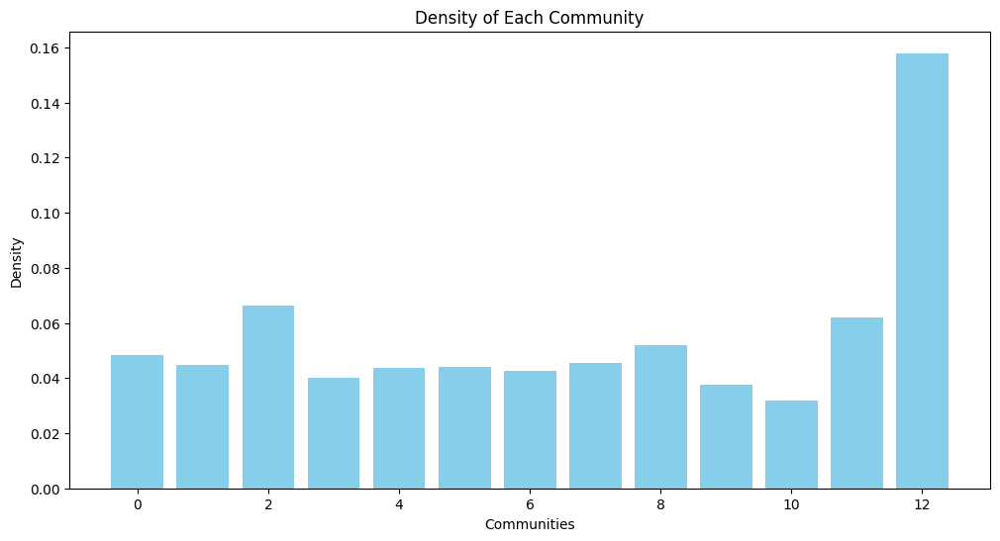

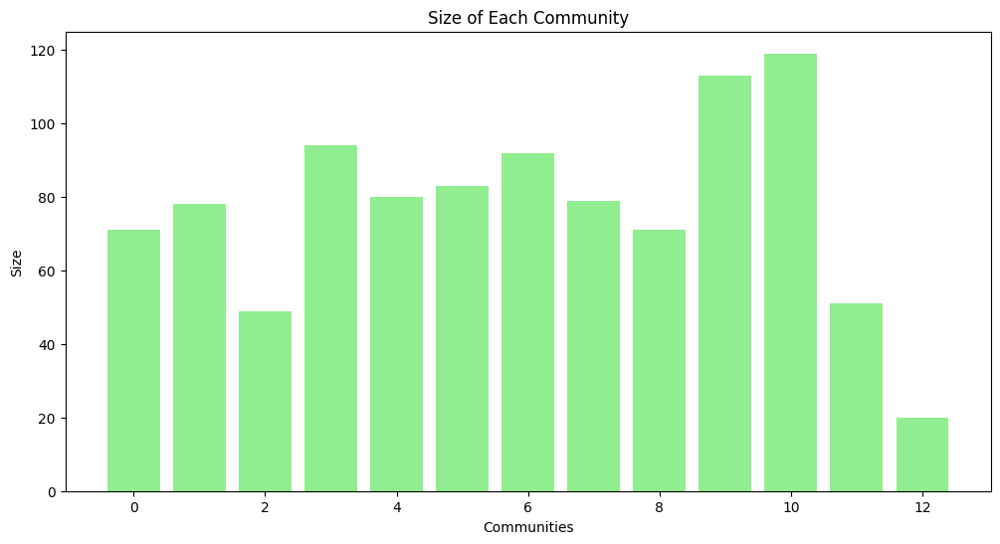

In [ ]:
densities = [profile['density'] for profile in community_profiles2.values()]
sizes = [len(profile['nodes']) for profile in community_profiles2.values()]
communities = community_profiles2.keys()

plt.figure(figsize=(12, 6))
plt.bar(communities, densities, color='skyblue')
plt.xlabel('Communities')
plt.ylabel('Density')
plt.title('Density of Each Community')
plt.show()

plt.figure(figsize=(12, 6))
plt.bar(communities, sizes, color='lightgreen')
plt.xlabel('Communities')
plt.ylabel('Size')
plt.title('Size of Each Community')
plt.show()